In [1]:
# read merged diag files for plotting
# initial built: 2025/02/07

# This scipt has been transformed to .py file:
# /scratch2/GFDL/gfdlscr/Chih-Chi.Hu/compile_radstats/common_obs_point_analysis
import os
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy

In [2]:
#exps = ['sc_CTRL', 'sc_full_clr_cld', 'sc_full_clr_cld_low', 'sc_full_sym_clwnbc', 'sc_full_sym_tri_clwnbc']
#exps = ['sc_CTRL', 'sc_full_clr_cld', 'sc_full_clr_cld_allsky', 'sc_full_sym_clwnbc', 'sc_full_sym_tri_clwnbc']
exps = ['sc_CTRL', 'sc_full_clr_cld', 'sc_full_clr_cld_allsky', 'sc_full_sym_tri_clwnbc', 'sc_full_low_sym_tri_clwnbc']

#instr='amsua'
instr='atms'
#sat='n15'
#sat='n19'
sat='n20'
#time='2022070106'
time='2022062506'

if instr == 'amsua':
    chs=[1,2,3,4,5,15]
elif instr == 'atms':
    chs=[1,2,3,4,5,6,16,17,18,19,20,21,22]
    
output_root = '/scratch2/GFDL/gfdlscr/Chih-Chi.Hu/compile_radstats/pkl_files_multi_exp'
output_fn   = f"{instr}_{sat}_gesanl_{time}_{'-'.join(exps)}.pkl"

# Reading a pickle file
df = pd.read_pickle(f"{output_root}/{output_fn}")

In [4]:
for i,exp in enumerate(exps):
    print(f"{i}:{exp}")

0:sc_CTRL
1:sc_full_clr_cld
2:sc_full_clr_cld_allsky
3:sc_full_sym_tri_clwnbc
4:sc_full_low_sym_tri_clwnbc


In [6]:
df.keys()

Index(['channel', 'lon', 'lat', 'fwater', 'obs', 'clw_obs', 'qc_sc_CTRL_ges',
       'omf_sc_CTRL_ges', 'omfnbc_sc_CTRL_ges', 'clw_model_sc_CTRL_ges',
       ...
       'inv_obserr_sc_full_low_sym_tri_clwnbc_anl',
       'omfnorm_sc_full_low_sym_tri_clwnbc_anl',
       'varbc_idx_sc_full_low_sym_tri_clwnbc_anl',
       'inner_pres_sc_full_low_sym_tri_clwnbc_anl',
       'inner_t_sc_full_low_sym_tri_clwnbc_anl',
       'inner_qv_sc_full_low_sym_tri_clwnbc_anl',
       'inner_ql_sc_full_low_sym_tri_clwnbc_anl',
       'jac_t_sc_full_low_sym_tri_clwnbc_anl',
       'jac_qv_sc_full_low_sym_tri_clwnbc_anl',
       'jac_ql_sc_full_low_sym_tri_clwnbc_anl'],
      dtype='object', length=156)

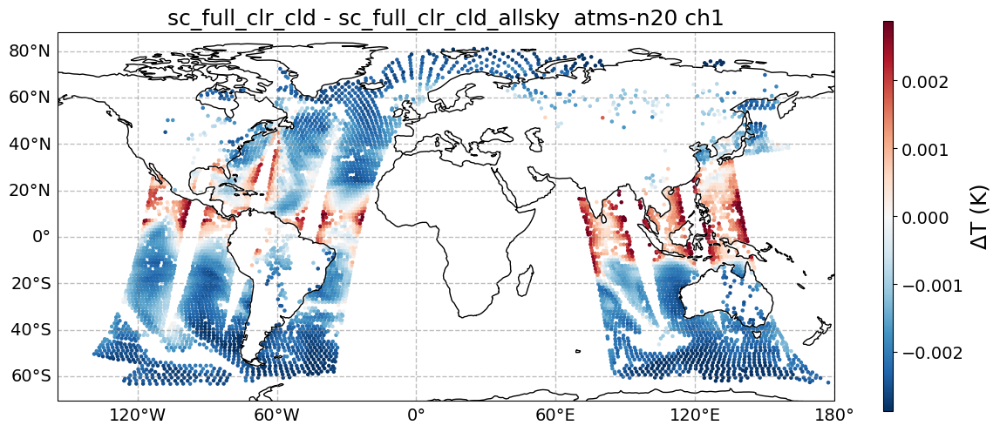

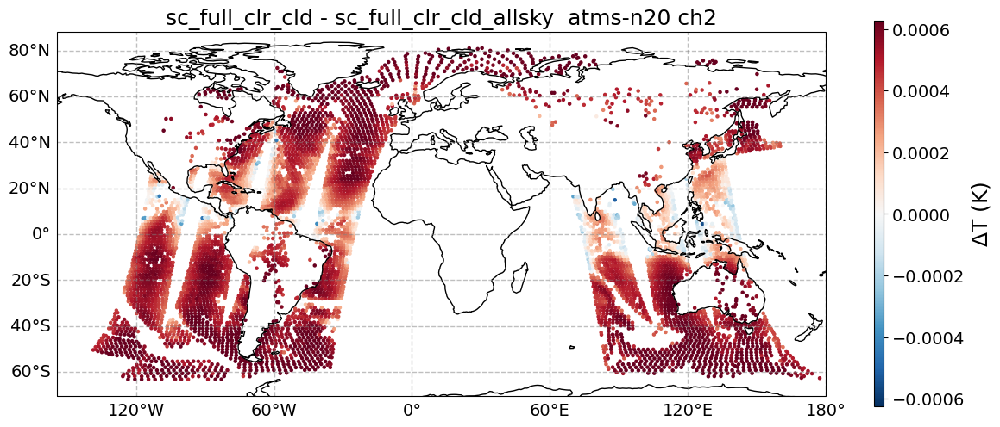

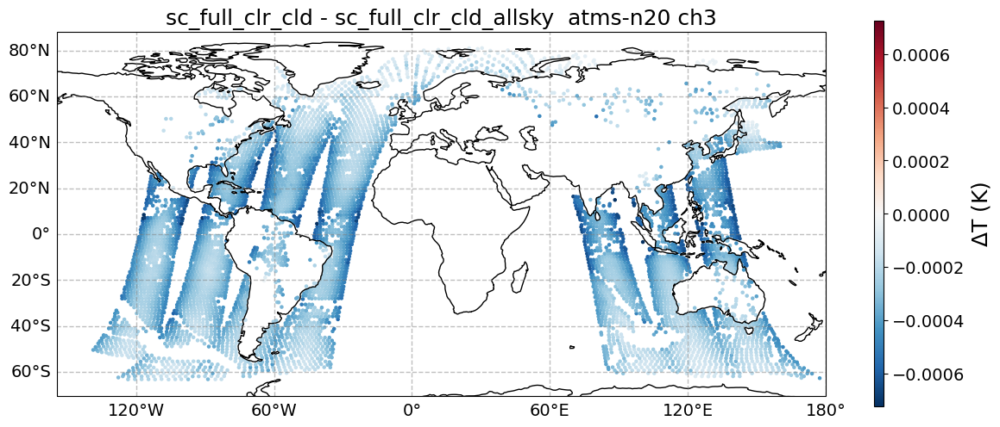

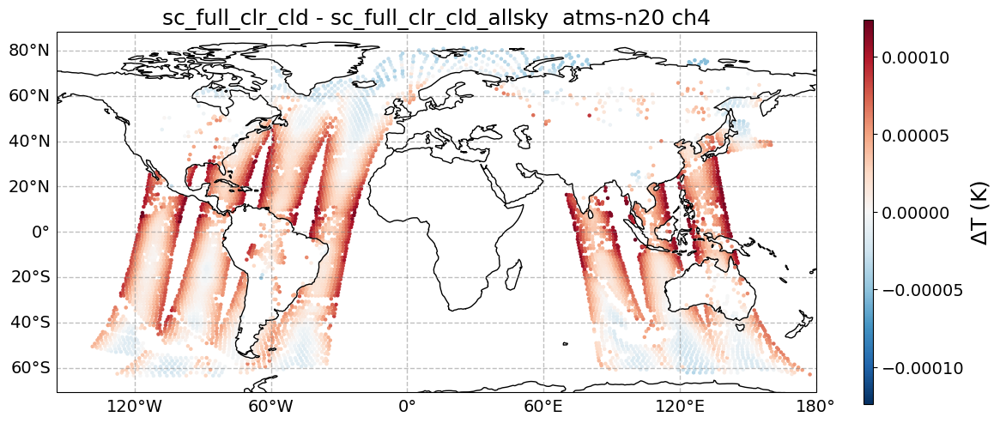

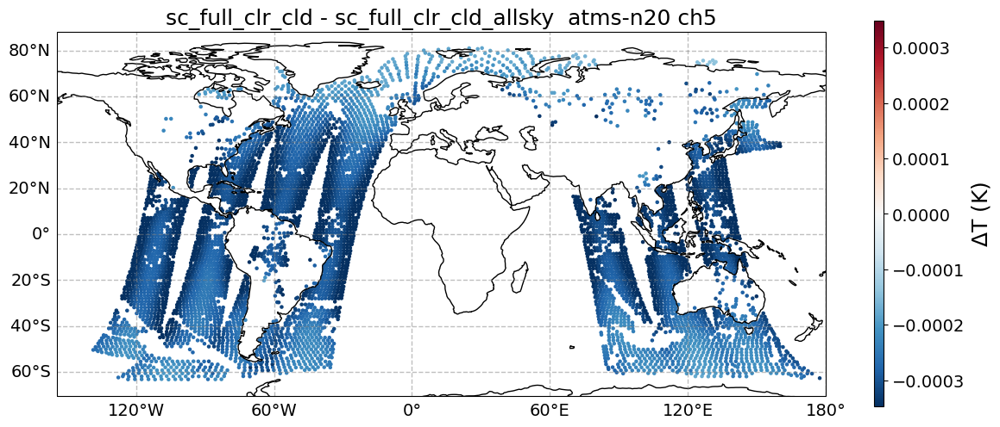

...

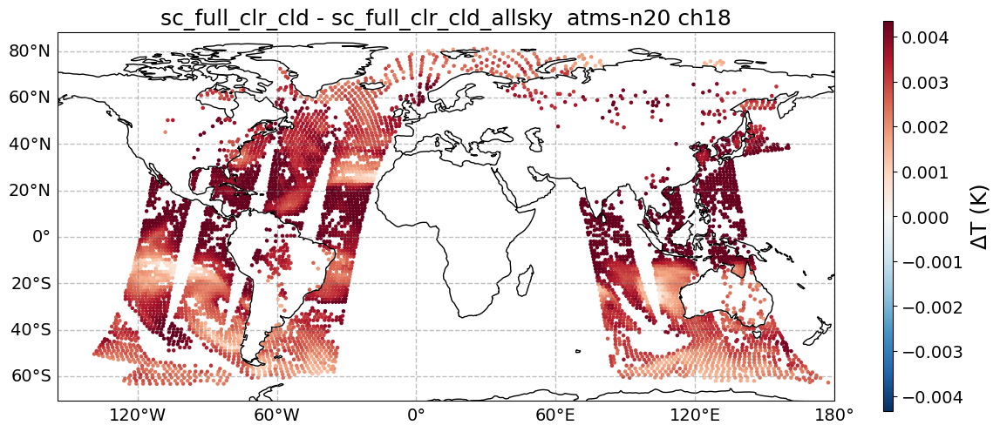

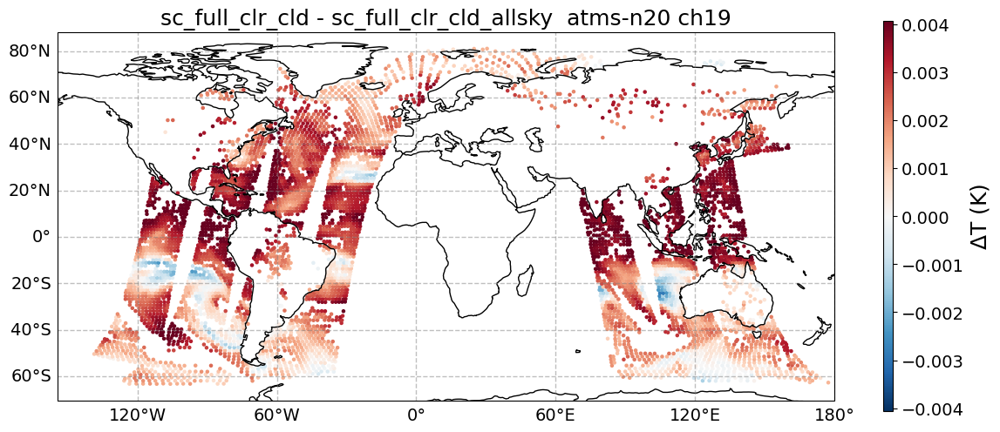

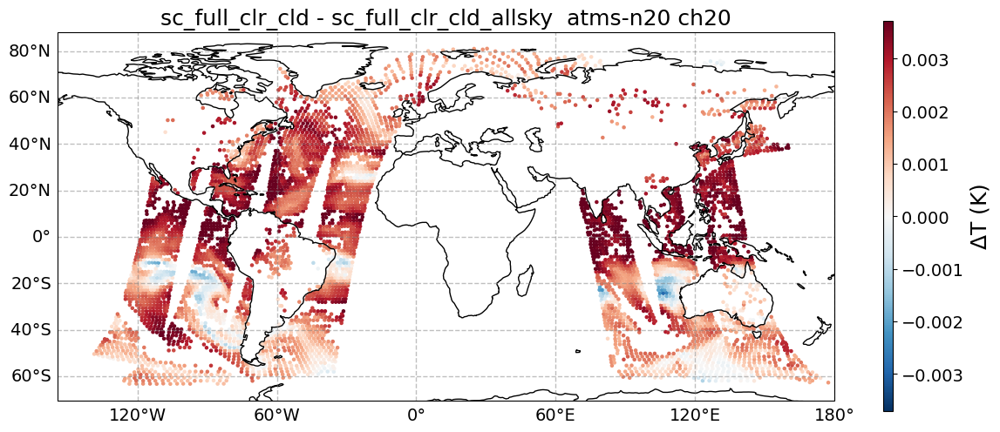

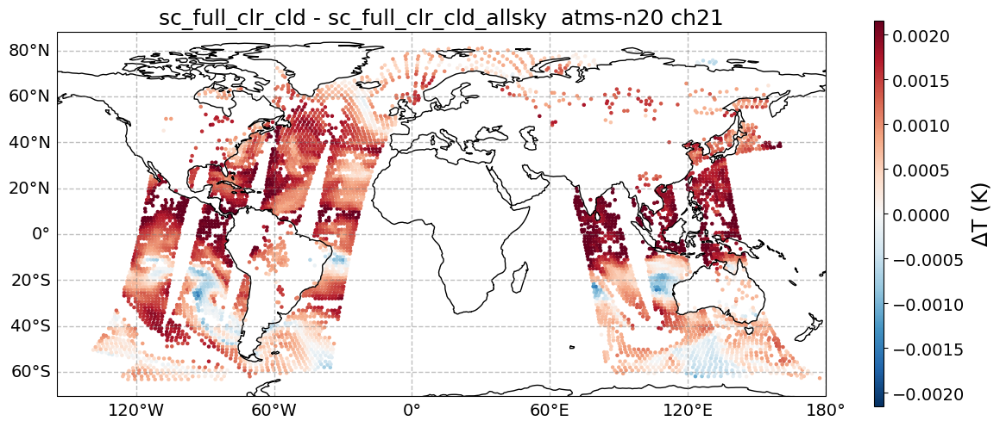

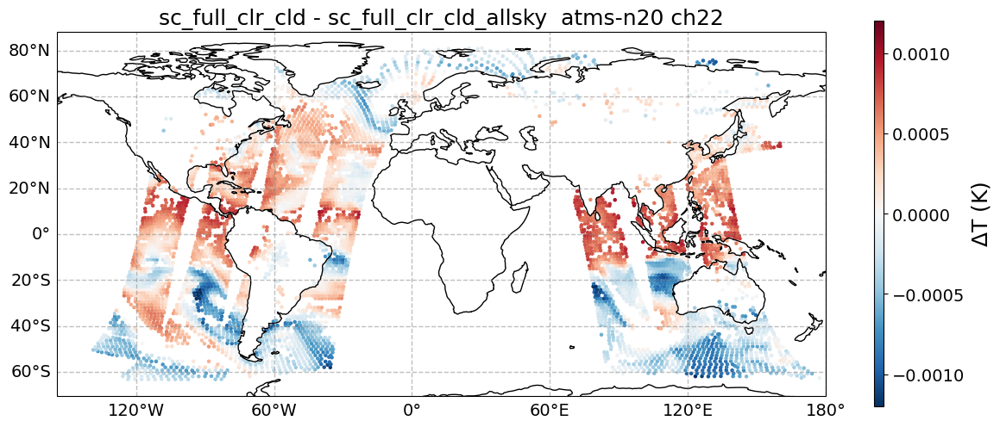

In [72]:
# Plot omf difference between two experiments' spatial distribution:

exptest = exps[1]
expref  = exps[2]

vmin = -0.1
vmax =  0.1

save_fig = False
fig_dir = f'/home/Chih-Chi.Hu/python_codes/figures/single_cycle_VarBC_sens_exp/omf_diff_map/{time}/{exptest}_ref_{expref}'

if not os.path.exists(fig_dir):
    os.makedirs(fig_dir)
    print(f"Directory '{fig_dir}' created.")

for plt_ch in chs:
    tmpdf = df[df['channel'] == plt_ch]
    lond = tmpdf['lon']
    latd = tmpdf['lat']
    omf_ref  = tmpdf[f'omf_{expref}_ges']
    omf_test = tmpdf[f'omf_{exptest}_ges']

    fig = plt.figure(figsize=(12,5))
    ax = fig.add_subplot(projection=ccrs.PlateCarree())

    ax.coastlines()
    scatter1 = ax.scatter(lond, latd, c=omf_ref - omf_test, s=5, cmap='RdBu_r')
    # Get the auto-calculated vmin and vmax
    vmin_auto = scatter1.norm.vmin
    vmax_auto = scatter1.norm.vmax

    # Set symmetric vmin and vmax
    vmin_new = -max(abs(vmin_auto), abs(vmax_auto))*0.8
    vmax_new = -vmin_new

    # Update the color normalization
    scatter1.set_clim(vmin_new, vmax_new)

    gl = ax.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False  # Hide labels on the top side
    gl.right_labels = False  # Hide labels on the right side
    gl.xlabel_style = {'size': 14}
    gl.ylabel_style = {'size': 14}

    ax.set_title(f'{exptest} - {expref}  {instr}-{sat} ch{plt_ch}', fontsize=18)
    #ax.set_title(f'{exptest} -  {expref}  {instr}-{sat} channel-{plt_ch} {time}')
    #ax.set_title(f'CLR/CLD - CTRL ({instr}-{sat}) CH{plt_ch}',fontsize=20)

    cbar = fig.colorbar(scatter1,location='right',aspect=40)
    cbar.set_label(r'$\Delta$T (K)', fontsize=18)
    cbar.ax.tick_params(labelsize=14)  # Increase tick label size
    plt.tight_layout()

    if save_fig:
        plt.savefig(f"{fig_dir}/{instr}_{sat}_ch{plt_ch}_{time}_{exptest}_minus_{expref}.png")

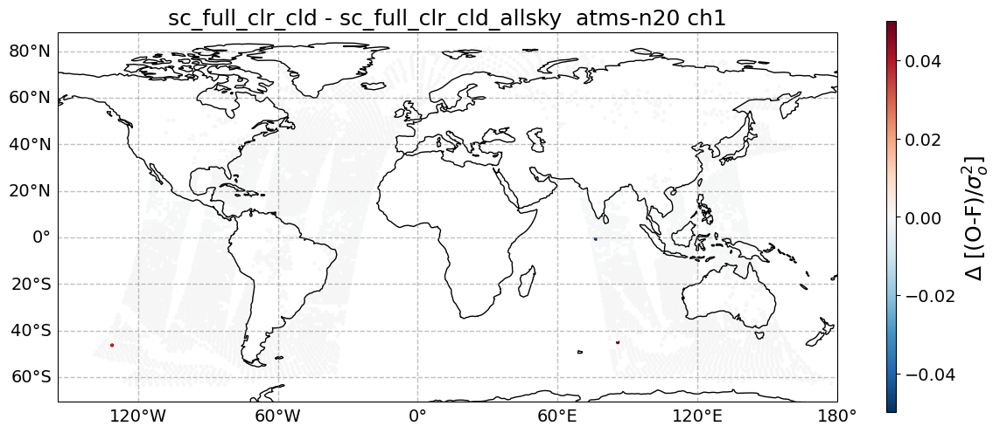

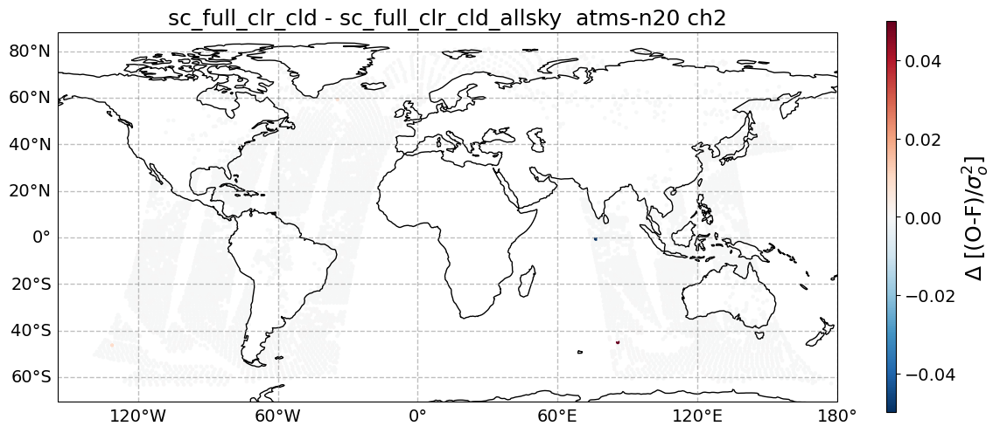

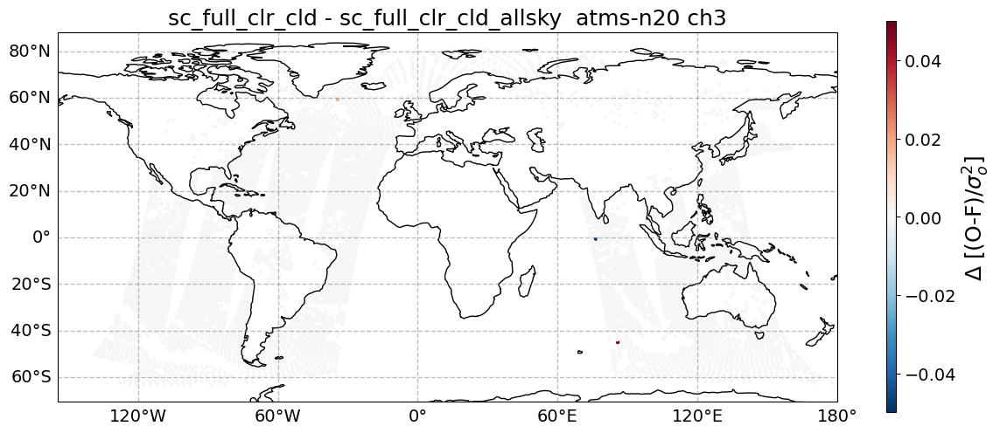

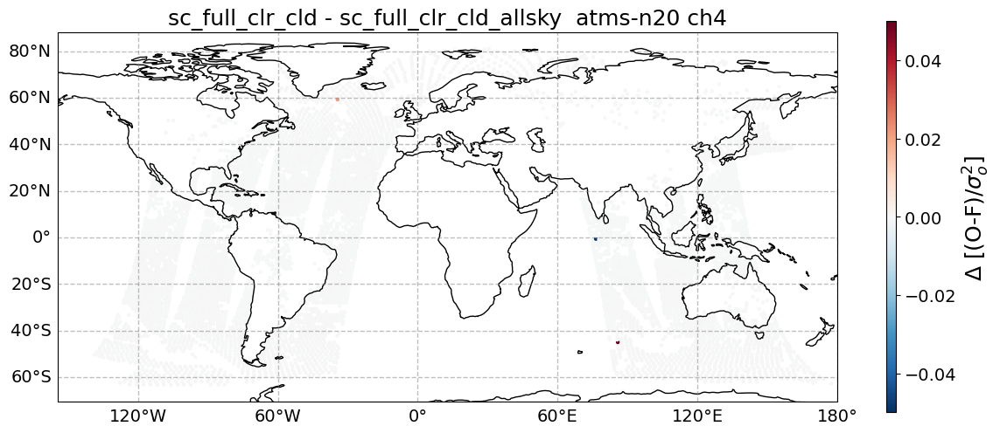

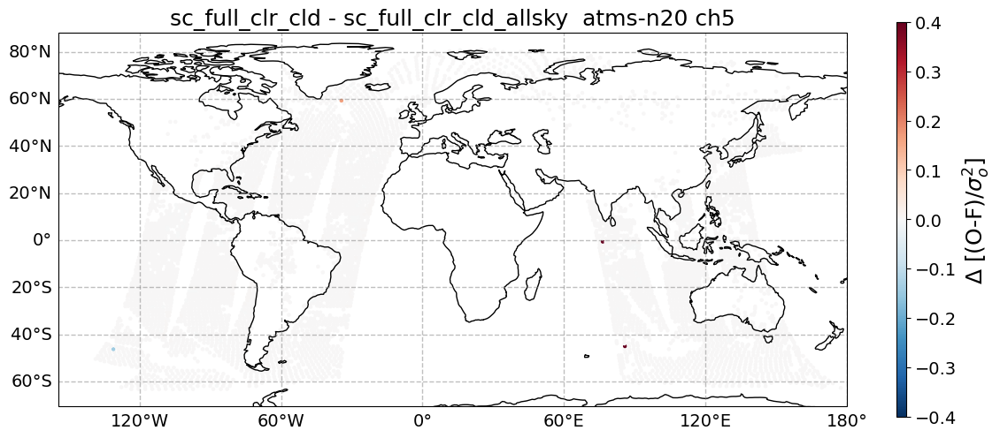

...

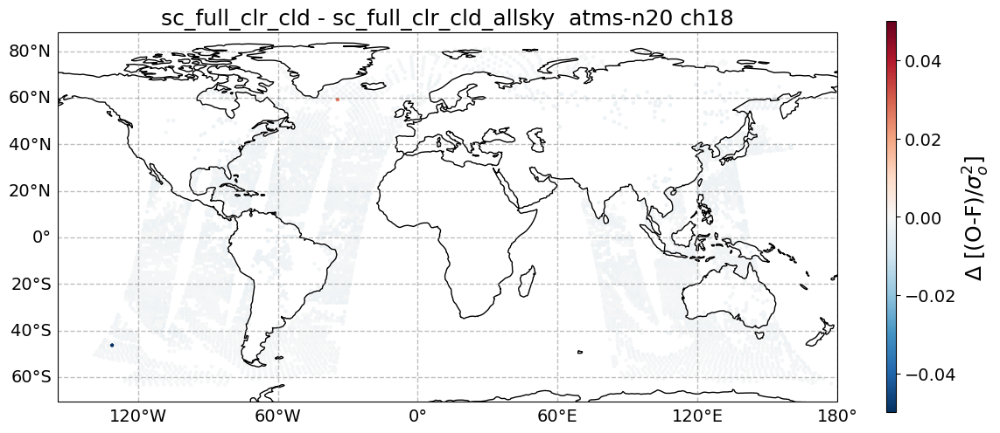

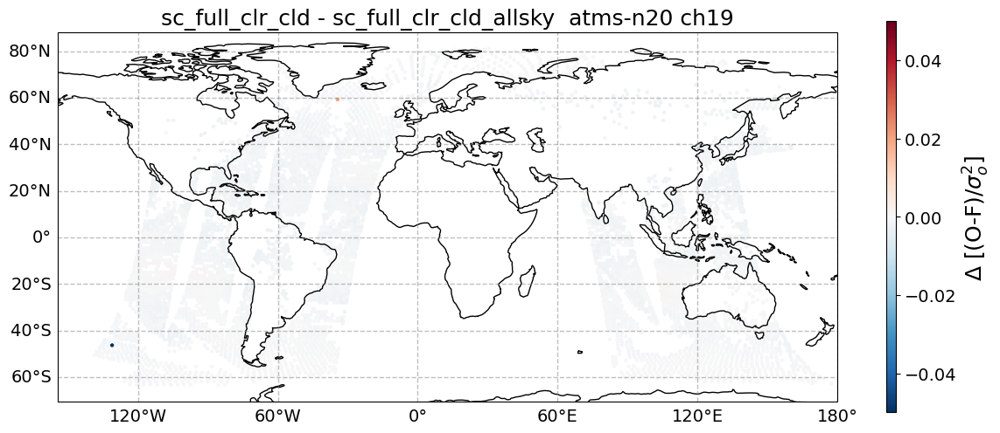

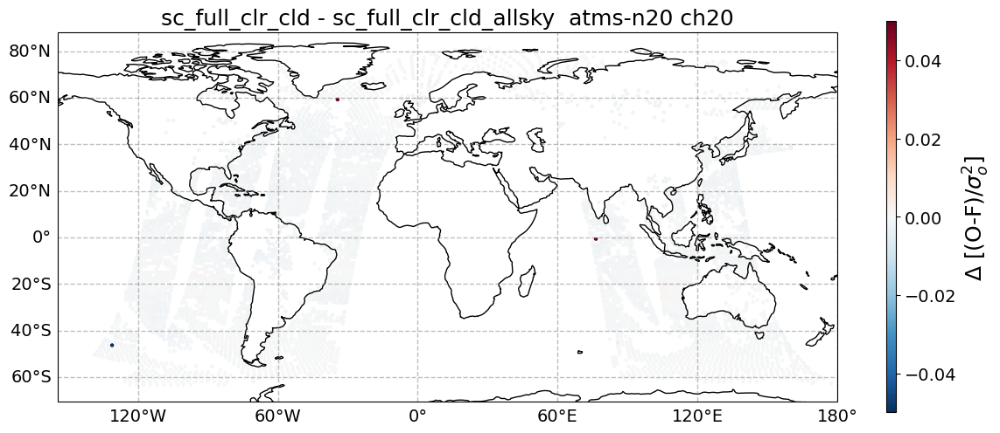

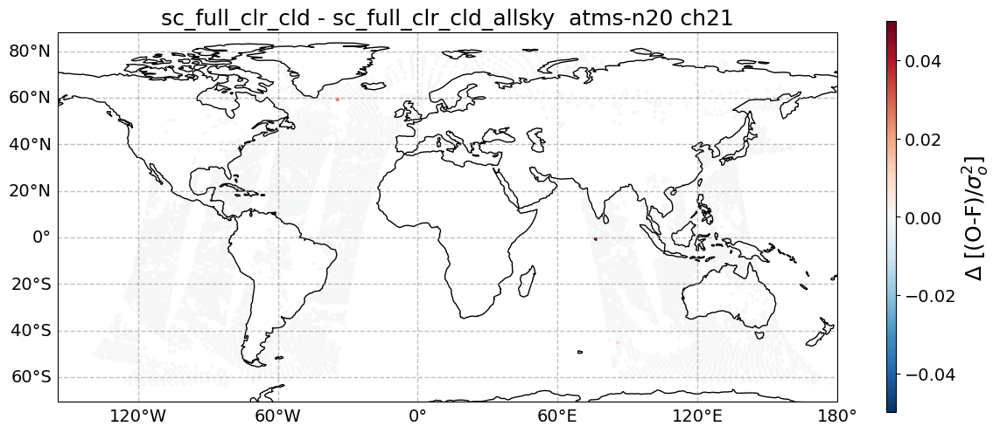

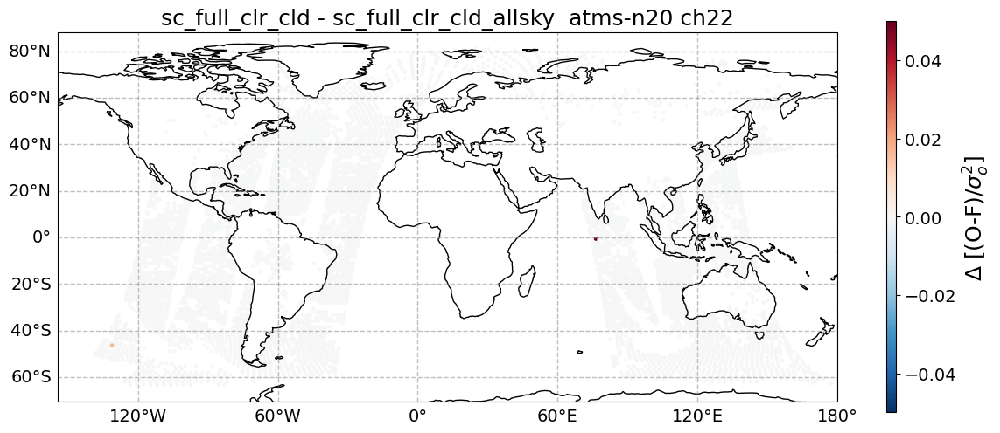

In [73]:
# Plot CH1 omfnorm difference between two experiments' spatial distribution:

exptest = exps[1]
expref  = exps[2]

save_fig = False
fig_dir = f'/home/Chih-Chi.Hu/python_codes/figures/single_cycle_VarBC_sens_exp/omfnorm_diff_map/{time}/{exptest}_ref_{expref}'

if not os.path.exists(fig_dir):
    os.makedirs(fig_dir)
    print(f"Directory '{fig_dir}' created.")

for plt_ch in chs:
    
    if instr == 'amsua':
        if plt_ch in (4,5):
            vmin = -0.4; vmax = 0.4;
        else:
            vmin = -0.05; vmax = 0.05
    elif instr == 'atms':
        if plt_ch in (5,6):
            vmin = -0.4; vmax = 0.4;
        else:
            vmin = -0.05; vmax = 0.05
    
    tmpdf = df[df['channel'] == plt_ch]
    lond = tmpdf['lon']
    latd = tmpdf['lat']
    omfnorm_ref  = tmpdf[f'omfnorm_{expref}_ges']
    omfnorm_test = tmpdf[f'omfnorm_{exptest}_ges']

    fig = plt.figure(figsize=(12,5))
    ax = fig.add_subplot(projection=ccrs.PlateCarree())

    ax.coastlines()
    scatter1 = ax.scatter(lond, latd, c=-(omfnorm_ref - omfnorm_test), s=5, vmin=vmin,vmax=vmax,cmap='RdBu_r')
    gl = ax.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False  # Hide labels on the top side
    gl.right_labels = False  # Hide labels on the right side
    gl.xlabel_style = {'size': 14}
    gl.ylabel_style = {'size': 14}
    ax.set_title(f'{exptest} - {expref}  {instr}-{sat} ch{plt_ch}', fontsize=18)
    #ax.set_title(f'CLR/CLD - CTRL (norm F-O) ({instr}-{sat}) CH{plt_ch}',fontsize=20)

    cbar = fig.colorbar(scatter1,location='right',aspect=40)
    cbar.set_label(r'$\Delta$ [(O-F)/$\sigma_o^2$] ', fontsize=18)
    cbar.ax.tick_params(labelsize=14)  # Increase tick label size
    plt.tight_layout()

    if save_fig:
        plt.savefig(f"{fig_dir}/fmonorm_{instr}_{sat}_ch{plt_ch}_{time}_{exptest}_minus_{expref}.png")

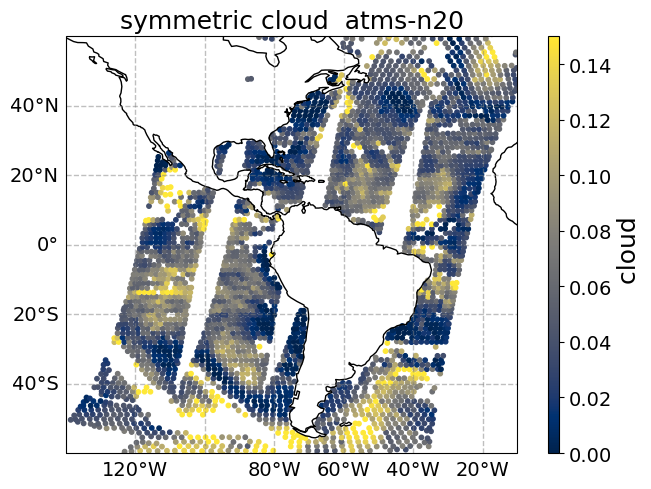

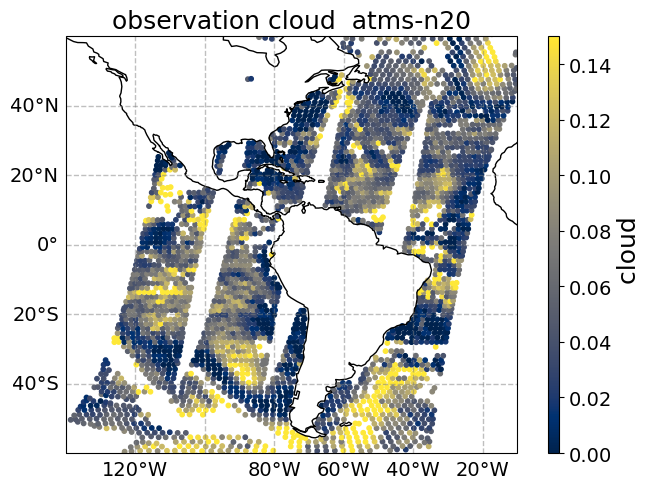

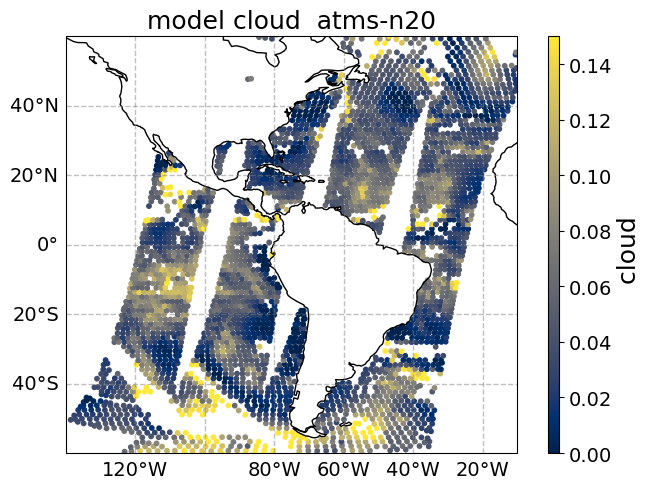

In [24]:
# Plot the map of symmetric cloud / obs cloud / model cloud:

expref  = exps[0]

# select a smaller region:
lat_s = -60 
lat_e =  60
lon_s = -140
lon_e =  -10

# plot properties:
dot_size = 10


save_fig = True
fig_dir = f'/scratch2/GFDL/gfdlscr/Chih-Chi.Hu/python_codes/figures/demo_use'
if not os.path.exists(fig_dir):
    os.makedirs(fig_dir)
    print(f"Directory '{fig_dir}' created.")

vmin = 0
vmax = 0.15
    
plt_ch = 1
tmpdf = df[ (df['channel'] == plt_ch) & (df['fwater'] > 0.99) ]
lond = tmpdf['lon']
latd = tmpdf['lat']

# symmetric cloud
symcloud = tmpdf[f'clw_sym_{expref}_ges']

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(projection=ccrs.PlateCarree())

ax.coastlines()
scatter1 = ax.scatter(lond, latd, c=symcloud, s=dot_size, vmin=vmin,vmax=vmax,cmap='cividis')
gl = ax.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False  # Hide labels on the top side
gl.right_labels = False  # Hide labels on the right side
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}
ax.set_extent([lon_s, lon_e, lat_s, lat_e], crs=ccrs.PlateCarree())
#ax.set_title(f'{expref}  symmetric cloud  {instr}-{sat}', fontsize=18)
ax.set_title(f'symmetric cloud  {instr}-{sat}', fontsize=18)

cbar = fig.colorbar(scatter1,location='right',aspect=40)
cbar.set_label(r'cloud ', fontsize=18)
cbar.ax.tick_params(labelsize=14)  # Increase tick label size
plt.tight_layout()

if save_fig:
    plt.savefig(f"{fig_dir}/symcloud_map_{instr}_{sat}_{time}_{expref}.png",bbox_inches='tight', dpi=300)
    
    
# observed cloud
obscloud = tmpdf[f'clw_obs']

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(projection=ccrs.PlateCarree())

ax.coastlines()
scatter1 = ax.scatter(lond, latd, c=obscloud, s=dot_size, vmin=vmin,vmax=vmax,cmap='cividis')
gl = ax.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False  # Hide labels on the top side
gl.right_labels = False  # Hide labels on the right side
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}
ax.set_extent([lon_s, lon_e, lat_s, lat_e], crs=ccrs.PlateCarree())
#ax.set_title(f'{expref}  observation cloud  {instr}-{sat}', fontsize=18)
ax.set_title(f'observation cloud  {instr}-{sat}', fontsize=18)

cbar = fig.colorbar(scatter1,location='right',aspect=40)
cbar.set_label(r'cloud ', fontsize=18)
cbar.ax.tick_params(labelsize=14)  # Increase tick label size
plt.tight_layout()

if save_fig:
    plt.savefig(f"{fig_dir}/obscloud_map_{instr}_{sat}_{time}_{expref}.png",bbox_inches='tight', dpi=300)
    
    
# model cloud
modelcloud = tmpdf[f'clw_model_{expref}_ges']

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(projection=ccrs.PlateCarree())

ax.coastlines()
scatter1 = ax.scatter(lond, latd, c=modelcloud, s=dot_size, vmin=vmin,vmax=vmax,cmap='cividis')
gl = ax.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False  # Hide labels on the top side
gl.right_labels = False  # Hide labels on the right side
gl.xlabel_style = {'size': 14}
gl.ylabel_style = {'size': 14}

ax.set_extent([lon_s, lon_e, lat_s, lat_e], crs=ccrs.PlateCarree())
#ax.set_title(f'{expref}  model cloud  {instr}-{sat}', fontsize=18)
ax.set_title(f'model cloud  {instr}-{sat}', fontsize=18)


cbar = fig.colorbar(scatter1,location='right',aspect=40)
cbar.set_label(r'cloud ', fontsize=18)
cbar.ax.tick_params(labelsize=14)  # Increase tick label size
plt.tight_layout()

if save_fig:
    plt.savefig(f"{fig_dir}/modelcloud_map_{instr}_{sat}_{time}_{expref}.png",bbox_inches='tight', dpi=300)

In [8]:
tmpdf

,channel,lon,lat,fwater,obs,clw_obs,qc_sc_CTRL_ges,omf_sc_CTRL_ges,omfnbc_sc_CTRL_ges,clw_model_sc_CTRL_ges,...,inv_obserr_sc_full_low_sym_tri_clwnbc_anl,omfnorm_sc_full_low_sym_tri_clwnbc_anl,varbc_idx_sc_full_low_sym_tri_clwnbc_anl,inner_pres_sc_full_low_sym_tri_clwnbc_anl,inner_t_sc_full_low_sym_tri_clwnbc_anl,inner_qv_sc_full_low_sym_tri_clwnbc_anl,inner_ql_sc_full_low_sym_tri_clwnbc_anl,jac_t_sc_full_low_sym_tri_clwnbc_anl,jac_qv_sc_full_low_sym_tri_clwnbc_anl,jac_ql_sc_full_low_sym_tri_clwnbc_anl
0,1,0.956920,56.968578,0.999815,195.734436,0.009967,0.0,0.598469,1.733678,0.019682,...,0.329976,0.065025,1.0,"[0.17350132763385773, 0.5105040073394775, 0.84...","[261.69036865234375, 261.69036865234375, 261.6...","[0.0037454667035490274, 0.0037454667035490274,...","[1.000999986899842e-06, 1.000999986899842e-06,...","[1.1571935829124413e-05, 3.803785375566804e-06...","[-7.24617566447705e-05, -7.632965571247041e-05...","[40.66482162475586, 40.66482162475586, 40.6648..."
13,1,1.315630,57.962269,1.000000,194.576019,0.027365,0.0,0.087322,1.213547,0.020543,...,0.345547,-0.059497,0.0,"[0.17350132763385773, 0.5105040073394775, 0.84...","[262.01788330078125, 262.01788330078125, 262.0...","[0.003955750726163387, 0.003955750726163387, 0...","[1.000999986899842e-06, 1.000999986899842e-06,...","[1.1643161997199059e-05, 3.839677901851246e-06...","[-0.00010861425107577816, -0.00011823329259641...","[39.497589111328125, 39.497589111328125, 39.49..."
26,1,2.754110,58.429871,1.000000,198.012817,0.051205,0.0,0.829162,1.966452,0.022580,...,0.322320,-0.053889,1.0,"[0.17350132763385773, 0.5105040073394775, 0.84...","[262.2843017578125, 262.2843017578125, 262.284...","[0.004071407485753298, 0.004071407485753298, 0...","[1.000999986899842e-06, 1.000999986899842e-06,...","[1.1218156032555271e-05, 3.693165808726917e-06...","[-6.692568422295153e-05, -7.000347250141203e-0...","[39.22782897949219, 39.22782897949219, 39.2278..."
39,1,359.193512,58.057911,1.000000,192.128418,0.033167,0.0,1.998088,3.116486,0.015750,...,0.349637,0.105140,1.0,"[0.17350132763385773, 0.5105040073394775, 0.84...","[262.00140380859375, 262.00140380859375, 262.0...","[0.003897819435223937, 0.003897819435223937, 0...","[1.000999986899842e-06, 1.000999986899842e-06,...","[1.2136683835706208e-05, 4.029036972497124e-06...","[-9.531323303235695e-05, -0.000103012396721169...","[37.920902252197266, 37.920902252197266, 37.92..."
52,1,1.339880,59.251091,1.000000,192.553192,0.058200,0.0,2.239802,3.344003,0.016872,...,0.306232,-0.089186,1.0,"[0.17350132763385773, 0.5105040073394775, 0.84...","[262.3514709472656, 262.3514709472656, 262.351...","[0.004149371292442083, 0.004149371292442083, 0...","[1.000999986899842e-06, 1.000999986899842e-06,...","[1.1898609955096617e-05, 3.945708158425987e-06...","[-3.6744695535162464e-05, -3.512907278491184e-...","[37.94881057739258, 37.94881057739258, 37.9488..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73003,1,357.483582,74.978279,1.000000,167.674423,0.063150,0.0,-0.769405,0.163246,0.068968,...,0.260481,-0.019169,1.0,"[0.17350132763385773, 0.5105040073394775, 0.84...","[269.4812927246094, 269.4812927246094, 269.481...","[0.002760242437943816, 0.002760242437943816, 0...","[1.000999986899842e-06, 1.000999986899842e-06,...","[1.5375793736893684e-05, 5.158954991202336e-06...","[-4.613278360920958e-05, -4.468126280698925e-0...","[38.268070220947266, 38.268070220947266, 38.26..."
73016,1,351.712128,76.352631,0.992830,161.181396,0.155469,0.0,5.403592,6.371031,0.101401,...,0.131961,0.069955,1.0,"[0.17350132763385773, 0.5105040073394775, 0.84...","[269.6007995605469, 269.6007995605469, 269.600...","[0.003910350613296032, 0.003910350613296032, 0...","[1.000999986899842e-06, 1.000999986899842e-06,...","[1.7014690456562676e-05, 5.850843990629073e-06...","[-6.99355878168717e-05, -7.297155389096588e-05...","[30.714065551757812, 30.714065551757812, 30.71..."
73029,1,357.349640,76.290092,1.000000,160.322311,0.112339,0.0,1.099751

In [3]:
## conditional observation point analysis
# separate obs data point into two: clear sky (sym <= 0.03), and cloudy sky

# filter out land data (where cloud is undefined)
tmpdf = df[df['fwater']>=0.99]

# group data into observation point:
group_df = tmpdf.groupby(['lat', 'lon'])


In [4]:
clear_keys = [key for key, g in group_df if g['clw_sym_sc_CTRL_ges'].iloc[0] < 0.03]
cloud_keys = [key for key, g in group_df if g['clw_sym_sc_CTRL_ges'].iloc[0] >= 0.03]

In [7]:
len(cloud_keys)

4346

In [8]:
group_df.get_group(clear_keys[0])

,channel,lon,lat,fwater,obs,clw_obs,qc_sc_CTRL_ges,omf_sc_CTRL_ges,omfnbc_sc_CTRL_ges,clw_model_sc_CTRL_ges,...,omfnorm_sc_full_low_sym_tri_clwnbc_ges,varbc_idx_sc_full_low_sym_tri_clwnbc_ges,qc_sc_full_low_sym_tri_clwnbc_anl,omf_sc_full_low_sym_tri_clwnbc_anl,omfnbc_sc_full_low_sym_tri_clwnbc_anl,clw_model_sc_full_low_sym_tri_clwnbc_anl,clw_sym_sc_full_low_sym_tri_clwnbc_anl,inv_obserr_sc_full_low_sym_tri_clwnbc_anl,omfnorm_sc_full_low_sym_tri_clwnbc_anl,varbc_idx_sc_full_low_sym_tri_clwnbc_anl
12151,1,176.016006,-56.754799,1.0,156.330002,0.020832,0.0,-1.661500,-1.013577,0.037449,...,-0.082282,1.0,0.0,0.145639,-0.034501,0.032537,0.026685,0.292506,0.012461,1.0
12152,2,176.016006,-56.754799,1.0,159.679993,0.020832,0.0,-1.826338,-0.666907,0.037449,...,-0.130336,1.0,0.0,-0.863840,-0.252222,0.032537,0.026685,0.306526,-0.081165,1.0
12153,3,176.016006,-56.754799,1.0,225.750000,0.020832,0.0,-1.448880,-1.620917,0.037449,...,-0.350067,1.0,0.0,-0.981259,-1.421944,0.032537,0.026685,0.537522,-0.283515,1.0
12154,4,176.016006,-56.754799,1.0,244.119995,0.020832,0.0,0.005214,-2.227380,0.037449,...,0.282810,1.0,0.0,0.114118,-2.165355,0.032537,0.026685,2.532818,0.732086,1.0
12155,5,176.016006,-56.754799,1.0,235.720001,0.020832,0.0,-0.045651,-1.973377,0.037449,...,-0.854823,1.0,0.0,0.016369,-1.922100,0.032537,0.026685,5.042404,0.416188,1.0
12156,15,176.016006,-56.754799,1.0,209.600006,0.020832,0.0,-4.151373,-1.947570,0.037449,...,-0.170128,1.0,0.0,-2.369518,-1.114400,0.032537,0.026685,0.232775,-0.128390,1.0


In [5]:
# takes a long long time...

# interpolate the Jacobian and the inner domain to the same vertical grid:
pres_interp= np.array( [0.5, 1.0, 3.0, 5.0, 10.0, 20.0, 30.0, 50.0, 75.0, 100.0, 125.0, 150.0, 175.0, 200.0, \
                        250.0, 275.0, 300.0, 325.0, 350.0, 375.0, 400.0, 425.0, 450.0, 475.0, 500.0, \
                        525.0, 550.0, 575.0, 600.0, 625.0, 650.0, 675.0, 700.0, 725.0, 750.0, 775.0, \
                        800.0, 825.0, 850.0, 875.0, 900.0, 925.0, 950.0, 975.0, 1000.0, 1025.0])


### clear-sky
print('processing clear sky data')

q_inc_clr = {};
t_inc_clr = {};
qa_clr = {};
ta_clr = {};
q_jac_clr = {};
t_jac_clr = {};
omfnorm_clr = {};

for exp in exps:
    
    print(f'processing {exp}')
    
    q_inc_clr[exp] = [];
    t_inc_clr[exp] = [];
    qa_clr[exp] = [];
    ta_clr[exp] = [];
    q_jac_clr[exp] = {};
    t_jac_clr[exp] = {};
    omfnorm_clr[exp] = {}; 
    
    for ii, key in enumerate(clear_keys):

        tmpdf_k = group_df.get_group(key)
        
        dq  = np.array(tmpdf_k[f'inner_qv_{exp}_anl'].iloc[0]) - np.array(tmpdf_k[f'inner_qv_{exp}_ges'].iloc[0])
        dt  = np.array(tmpdf_k[f'inner_t_{exp}_anl'].iloc[0])  - np.array(tmpdf_k[f'inner_t_{exp}_ges'].iloc[0])
        qa  = np.array(tmpdf_k[f'inner_qv_{exp}_anl'].iloc[0]) 
        ta  = np.array(tmpdf_k[f'inner_t_{exp}_anl'].iloc[0])
        pres = np.array(tmpdf_k[f'inner_pres_{exp}_ges'].iloc[0])

        # interpolate onto common grid:
        dq_interp = np.interp(pres_interp, pres, dq)
        dt_interp = np.interp(pres_interp, pres, dt)
        qa_interp = np.interp(pres_interp, pres, qa)
        ta_interp = np.interp(pres_interp, pres, ta) 

        q_inc_clr[exp].append(dq_interp)
        t_inc_clr[exp].append(dt_interp)
        qa_clr[exp].append(qa_interp)
        ta_clr[exp].append(ta_interp)

        ## retrieve the Jacobians & omfnorms:
        # initialization of dic
        if ii == 0:
            if instr == 'amsua':
                q_jac_clr[exp][1] = [];  t_jac_clr[exp][1] = [];  omfnorm_clr[exp][1] = [];
                q_jac_clr[exp][2] = [];  t_jac_clr[exp][2] = [];  omfnorm_clr[exp][2] = [];
                q_jac_clr[exp][3] = [];  t_jac_clr[exp][3] = [];  omfnorm_clr[exp][3] = [];
                q_jac_clr[exp][4] = [];  t_jac_clr[exp][4] = [];  omfnorm_clr[exp][4] = [];
                q_jac_clr[exp][5] = [];  t_jac_clr[exp][5] = [];  omfnorm_clr[exp][5] = [];
                q_jac_clr[exp][15] =[];  t_jac_clr[exp][15] = []; omfnorm_clr[exp][15] = [];
            elif instr == 'atms':
                q_jac_clr[exp][1] = [];  t_jac_clr[exp][1] = [];  omfnorm_clr[exp][1] = [];
                q_jac_clr[exp][2] = [];  t_jac_clr[exp][2] = [];  omfnorm_clr[exp][2] = [];
                q_jac_clr[exp][3] = [];  t_jac_clr[exp][3] = [];  omfnorm_clr[exp][3] = [];
                q_jac_clr[exp][4] = [];  t_jac_clr[exp][4] = [];  omfnorm_clr[exp][4] = [];
                q_jac_clr[exp][5] = [];  t_jac_clr[exp][5] = [];  omfnorm_clr[exp][5] = [];
                q_jac_clr[exp][6] = [];  t_jac_clr[exp][6] = [];  omfnorm_clr[exp][6] = [];
                q_jac_clr[exp][16] =[];  t_jac_clr[exp][16] = []; omfnorm_clr[exp][16] = [];
                q_jac_clr[exp][17] =[];  t_jac_clr[exp][17] = []; omfnorm_clr[exp][17] = [];
                q_jac_clr[exp][18] =[];  t_jac_clr[exp][18] = []; omfnorm_clr[exp][18] = [];
                q_jac_clr[exp][19] =[];  t_jac_clr[exp][19] = []; omfnorm_clr[exp][19] = [];
                q_jac_clr[exp][20] =[];  t_jac_clr[exp][20] = []; omfnorm_clr[exp][20] = [];
                q_jac_clr[exp][21] =[];  t_jac_clr[exp][21] = []; omfnorm_clr[exp][21] = [];
                q_jac_clr[exp][22] =[];  t_jac_clr[exp][22] = []; omfnorm_clr[exp][22] = [];
                
        q_jac = {}; t_jac = {}; omfnorm = {};
        for ch in tmpdf_k['channel']:
            q_jac_tmp = np.array(tmpdf_k.loc[tmpdf_k['channel'] == ch, f'jac_qv_{exp}_ges'].iloc[0])
            q_jac[ch] = np.interp(pres_interp, pres, q_jac_tmp)
            t_jac_tmp = np.array(tmpdf_k.loc[tmpdf_k['channel'] == ch, f'jac_t_{exp}_ges'].iloc[0])
            t_jac[ch] = np.interp(pres_interp, pres, t_jac_tmp)
            omfnorm[ch] = (tmpdf_k.loc[tmpdf_k['channel'] == ch, f'omfnorm_{exp}_ges'].iloc[0])

            q_jac_clr[exp][ch].append(q_jac[ch]*qa_interp*0.1)
            t_jac_clr[exp][ch].append(t_jac[ch])
            omfnorm_clr[exp][ch].append(omfnorm[ch])
            
### cloudy_sky
print('processing cloudy sky data')

q_inc_cld = {};
t_inc_cld = {};
qa_cld = {};
ta_cld = {};
q_jac_cld = {};
t_jac_cld = {};
omfnorm_cld = {};

for exp in exps:
    
    print(f'processing {exp}')
    
    q_inc_cld[exp] = [];
    t_inc_cld[exp] = [];
    qa_cld[exp] = [];
    ta_cld[exp] = [];
    q_jac_cld[exp] = {};
    t_jac_cld[exp] = {};
    omfnorm_cld[exp] = {}; 
    
    for ii, key in enumerate(cloud_keys):

        tmpdf_k = group_df.get_group(key)

        dq  = np.array(tmpdf_k[f'inner_qv_{exp}_anl'].iloc[0]) - np.array(tmpdf_k[f'inner_qv_{exp}_ges'].iloc[0])
        dt  = np.array(tmpdf_k[f'inner_t_{exp}_anl'].iloc[0])  - np.array(tmpdf_k[f'inner_t_{exp}_ges'].iloc[0])
        qa  = np.array(tmpdf_k[f'inner_qv_{exp}_anl'].iloc[0]) 
        ta  = np.array(tmpdf_k[f'inner_t_{exp}_anl'].iloc[0])
        pres = np.array(tmpdf_k[f'inner_pres_{exp}_ges'].iloc[0])

        # interpolate onto common grid:
        dq_interp = np.interp(pres_interp, pres, dq)
        dt_interp = np.interp(pres_interp, pres, dt)
        qa_interp = np.interp(pres_interp, pres, qa)
        ta_interp = np.interp(pres_interp, pres, ta) 

        q_inc_cld[exp].append(dq_interp)
        t_inc_cld[exp].append(dt_interp)
        qa_cld[exp].append(qa_interp)
        ta_cld[exp].append(ta_interp)

        ## retrieve the Jacobians & omfnorms:
        # initialization of dic
        if ii == 0:
            if instr == 'amsua':
                q_jac_cld[exp][1] = [];  t_jac_cld[exp][1] = [];  omfnorm_cld[exp][1] = [];
                q_jac_cld[exp][2] = [];  t_jac_cld[exp][2] = [];  omfnorm_cld[exp][2] = [];
                q_jac_cld[exp][3] = [];  t_jac_cld[exp][3] = [];  omfnorm_cld[exp][3] = [];
                q_jac_cld[exp][4] = [];  t_jac_cld[exp][4] = [];  omfnorm_cld[exp][4] = [];
                q_jac_cld[exp][5] = [];  t_jac_cld[exp][5] = [];  omfnorm_cld[exp][5] = [];
                q_jac_cld[exp][15] =[];  t_jac_cld[exp][15] = []; omfnorm_cld[exp][15] = [];
            elif instr == 'atms':
                q_jac_cld[exp][1] = [];  t_jac_cld[exp][1] = [];  omfnorm_cld[exp][1] = [];
                q_jac_cld[exp][2] = [];  t_jac_cld[exp][2] = [];  omfnorm_cld[exp][2] = [];
                q_jac_cld[exp][3] = [];  t_jac_cld[exp][3] = [];  omfnorm_cld[exp][3] = [];
                q_jac_cld[exp][4] = [];  t_jac_cld[exp][4] = [];  omfnorm_cld[exp][4] = [];
                q_jac_cld[exp][5] = [];  t_jac_cld[exp][5] = [];  omfnorm_cld[exp][5] = [];
                q_jac_cld[exp][6] = [];  t_jac_cld[exp][6] = [];  omfnorm_cld[exp][6] = [];
                q_jac_cld[exp][16] = [];  t_jac_cld[exp][16] = [];  omfnorm_cld[exp][16] = [];
                q_jac_cld[exp][17] = [];  t_jac_cld[exp][17] = [];  omfnorm_cld[exp][17] = [];
                q_jac_cld[exp][18] = [];  t_jac_cld[exp][18] = [];  omfnorm_cld[exp][18] = [];
                q_jac_cld[exp][19] = [];  t_jac_cld[exp][19] = [];  omfnorm_cld[exp][19] = [];
                q_jac_cld[exp][20] = [];  t_jac_cld[exp][20] = [];  omfnorm_cld[exp][20] = [];
                q_jac_cld[exp][21] = [];  t_jac_cld[exp][21] = [];  omfnorm_cld[exp][21] = [];
                q_jac_cld[exp][22] = [];  t_jac_cld[exp][22] = [];  omfnorm_cld[exp][22] = [];
                
                
        q_jac = {}; t_jac = {}; omfnorm = {};
        for ch in tmpdf_k['channel']:
            q_jac_tmp = np.array(tmpdf_k.loc[tmpdf_k['channel'] == ch, f'jac_qv_{exp}_ges'].iloc[0])
            q_jac[ch] = np.interp(pres_interp, pres, q_jac_tmp)
            t_jac_tmp = np.array(tmpdf_k.loc[tmpdf_k['channel'] == ch, f'jac_t_{exp}_ges'].iloc[0])
            t_jac[ch] = np.interp(pres_interp, pres, t_jac_tmp)
            omfnorm[ch] = (tmpdf_k.loc[tmpdf_k['channel'] == ch, f'omfnorm_{exp}_ges'].iloc[0])

            q_jac_cld[exp][ch].append(q_jac[ch]*qa_interp*0.1)
            t_jac_cld[exp][ch].append(t_jac[ch])
            omfnorm_cld[exp][ch].append(omfnorm[ch])

processing clear sky data
processing sc_CTRL
processing sc_full_clr_cld
processing sc_full_clr_cld_allsky
processing sc_full_sym_tri_clwnbc
processing sc_full_low_sym_tri_clwnbc
processing cloudy sky data
processing sc_CTRL
processing sc_full_clr_cld
processing sc_full_clr_cld_allsky
processing sc_full_sym_tri_clwnbc
processing sc_full_low_sym_tri_clwnbc


In [6]:
for i,exp in enumerate(exps):
    print(f"{i}:{exp}")

0:sc_CTRL
1:sc_full_clr_cld
2:sc_full_clr_cld_allsky
3:sc_full_sym_tri_clwnbc
4:sc_full_low_sym_tri_clwnbc


In [7]:
# define the comparision:
exptest = exps[3]
expref  = exps[1]

if instr == 'amsua':
    plt_chs = chs
    plt_tag = ''
elif instr == 'atms':
    #plt_chs = [1,2,3,4,5,6,16,17]
    plt_chs = [18,19,20,21,22]
    #plt_tag = '_ch1_17'
    plt_tag = '_ch18_22'
    
save_fig = False
fig_dir = f'/home/Chih-Chi.Hu/python_codes/figures/single_cycle_VarBC_sens_exp/conditional_clr_cloud_analysis/{time}/{exptest}_ref_{expref}'

if not os.path.exists(fig_dir):
    os.makedirs(fig_dir)
    print(f"Directory '{fig_dir}' created.")

Directory '/home/Chih-Chi.Hu/python_codes/figures/single_cycle_VarBC_sens_exp/conditional_clr_cloud_analysis/2022062506/sc_full_sym_tri_clwnbc_ref_sc_full_clr_cld' created.


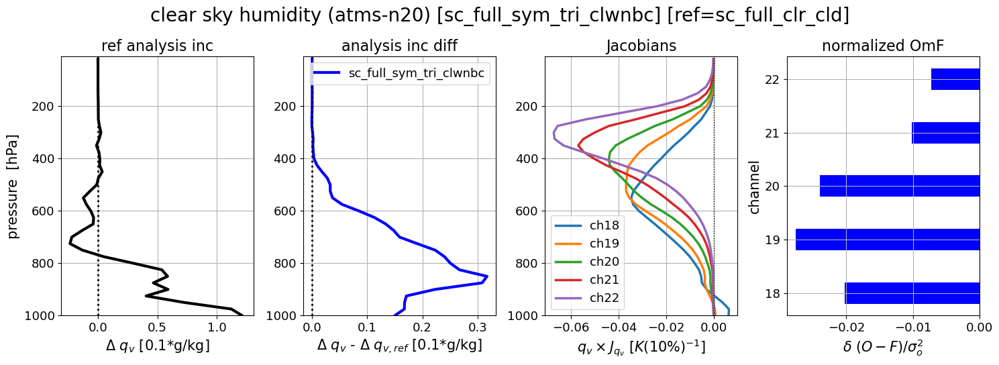

In [9]:
# profile summary clear sky - humidity:


fig = plt.figure(figsize=(15,5.5))

# define the subplots
ax1 = fig.add_subplot(1, 4, 1)  # Add subplot at position 1
ax2 = fig.add_subplot(1, 4, 2)  # Add subplot at position 2
ax3 = fig.add_subplot(1, 4, 3)  # Add subplot at position 3
ax4 = fig.add_subplot(1, 4, 4)  # Add subplot at position 4

# ax1: reference analysis increment

plt_var = np.mean(np.array(q_inc_clr[expref]), axis=0)
ax1.plot(10*plt_var[5:], pres_interp[5:], linewidth=3, label=rf'$\Delta$ qv ({expref})', color='black', linestyle='-')
ax1.axvline(x=0, color='black', linestyle=':', linewidth=2)
ax1.set_ylim(1000,10)
ax1.set_xlabel(r'$\Delta$ $q_v$ [0.1*g/kg]', fontsize=15)
ax1.set_ylabel('pressure  [hPa]', fontsize=15)
ax1.grid(True)
#ax1.legend(fontsize=13)
ax1.tick_params(axis='both', which='major', labelsize=13)
ax1.set_title('ref analysis inc', fontsize=16)


# ax2: differences in analysis increment
plt_var = np.mean(np.array(qa_clr[exptest]) - np.array(qa_clr[expref]), axis=0)

ax2.plot(10*plt_var[5:], pres_interp[5:], color='blue', linewidth=3, label=rf'{exptest}')
ax2.axvline(x=0, color='black', linestyle=':', linewidth=2)
ax2.set_ylim(1000,10)
#ax2.set_xlim([-0.1,0.1])
#ax.set_xlabel(r'$ \partial T_B / \partial T$  [K/K]', fontsize=14)
#ax2.set_ylabel('pressure  [hPa]', fontsize=14)
ax2.set_xlabel(r"$\Delta$ $q_v$ - $\Delta$ $q_{v,ref}$ [0.1*g/kg]", fontsize=15)
ax2.grid(True)
ax2.tick_params(axis='both', which='major', labelsize=13)
ax2.legend(fontsize=13, loc='upper right')
ax2.set_title('analysis inc diff', fontsize=16)


# ax3: Jacobians
for c, ch in enumerate(plt_chs):
    plt_var = np.mean(np.array(q_jac_clr[expref][ch]),axis=0)
    ax3.plot(plt_var[5:], pres_interp[5:], linewidth=2.5, label=f"ch{ch}")
    
ax3.axvline(x=0, color='black', linestyle=':', linewidth=1)
ax3.set_ylim(1000,10)
#ax.set_xlabel(r'$ \partial T_B / \partial T$  [K/K]', fontsize=14)
#ax3.set_ylabel('pressure  [hPa]', fontsize=14)
ax3.set_xlabel(rf"$ q_v \times J_{{q_v}}$ $[K (10\%)^{{-1}}] $", fontsize=15)
ax3.grid(True)
ax3.tick_params(axis='both', which='major', labelsize=13)
ax3.legend(fontsize=13, loc='best')
ax3.set_title('Jacobians', fontsize=16)


# ax4: channel infos:
bar_height = 0.4

plt_var=[];
for ch in plt_chs:
    plt_var.append(np.mean(np.array(omfnorm_clr[exptest][ch]) - np.array(omfnorm_clr[expref][ch])))
    
ax4.barh([str(ch) for ch in plt_chs], plt_var,  height=bar_height, label=f'{exptest}-{expref}', color='blue')
ax4.set_xlabel(r'$\delta$ $(O-F)/ \sigma_o^2$', fontsize=15)
ax4.set_yticks([r for r in range(len(plt_chs))], plt_chs, fontsize=14)
#ax4.yaxis.tick_right()
ax4.tick_params(axis='both', which='major', labelsize=13)
#ax4.set_xlim([-0.04,0.04])
ax4.set_ylabel('channel',fontsize=15)
ax4.grid(True)
#ax4.legend(fontsize=13)
ax4.set_title('normalized OmF', fontsize=16)

fig.suptitle(f'clear sky humidity ({instr}-{sat}) [{exptest}] [ref={expref}]', fontsize=20)
plt.tight_layout()

if save_fig:
    plt.savefig(f"{fig_dir}/clear_humidity_{instr}-{sat}{plt_tag}_{time}_{exptest}_ref_{expref}.png")

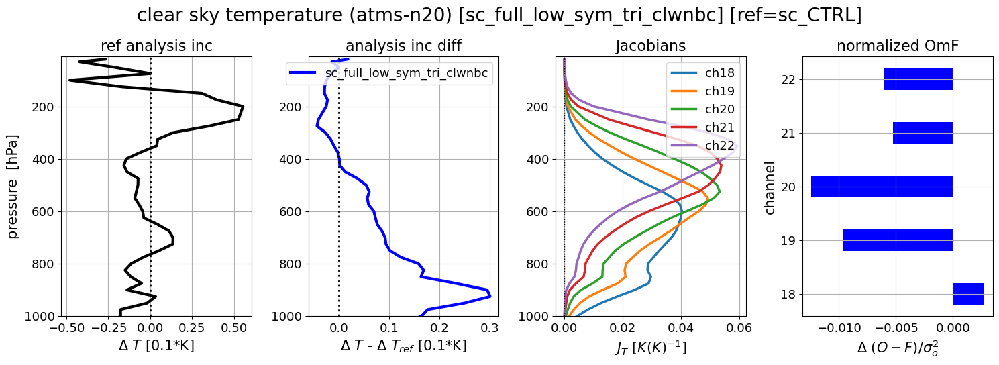

In [69]:
# profile summary clear sky - Temperautre:

fig = plt.figure(figsize=(15,5.5))

# define the subplots
ax1 = fig.add_subplot(1, 4, 1)  # Add subplot at position 1
ax2 = fig.add_subplot(1, 4, 2)  # Add subplot at position 2
ax3 = fig.add_subplot(1, 4, 3)  # Add subplot at position 3
ax4 = fig.add_subplot(1, 4, 4)  # Add subplot at position 4

# ax1: reference analysis increment

plt_var = np.mean(np.array(t_inc_clr[expref]), axis=0)
ax1.plot(10*plt_var[5:], pres_interp[5:], linewidth=3, label=rf'$\Delta$ T ({expref})', color='black', linestyle='-')
ax1.axvline(x=0, color='black', linestyle=':', linewidth=2)
ax1.set_ylim(1000,10)
ax1.set_xlabel(r'$\Delta$ $T$ [0.1*K]', fontsize=15)
ax1.set_ylabel('pressure  [hPa]', fontsize=15)
ax1.grid(True)
#ax1.legend(fontsize=13)
ax1.tick_params(axis='both', which='major', labelsize=13)
ax1.set_title('ref analysis inc', fontsize=16)


# ax2: differences in analysis increment
plt_var = np.mean(np.array(ta_clr[exptest]) - np.array(ta_clr[expref]), axis=0)

ax2.plot(10*plt_var[5:], pres_interp[5:], color='blue', linewidth=3, label=rf'{exptest}')
ax2.axvline(x=0, color='black', linestyle=':', linewidth=2)
ax2.set_ylim(1000,10)
#ax2.set_xlim([-0.1,0.1])
#ax.set_xlabel(r'$ \partial T_B / \partial T$  [K/K]', fontsize=14)
#ax2.set_ylabel('pressure  [hPa]', fontsize=14)
ax2.set_xlabel(r"$\Delta$ $T$ - $\Delta$ $T_{ref}$ [0.1*K]", fontsize=15)
ax2.grid(True)
ax2.tick_params(axis='both', which='major', labelsize=13)
ax2.legend(fontsize=13, loc='upper right')
ax2.set_title('analysis inc diff', fontsize=16)


# ax3: Jacobians
for c, ch in enumerate(plt_chs):
    plt_var = np.mean(np.array(t_jac_clr[expref][ch]),axis=0)
    ax3.plot(plt_var[5:], pres_interp[5:], linewidth=2.5, label=f"ch{ch}")
    
ax3.axvline(x=0, color='black', linestyle=':', linewidth=1)
ax3.set_ylim(1000,10)
#ax.set_xlabel(r'$ \partial T_B / \partial T$  [K/K]', fontsize=14)
#ax3.set_ylabel('pressure  [hPa]', fontsize=14)
ax3.set_xlabel(rf"$ J_{{T}}$ $[K (K)^{{-1}}] $", fontsize=15)
ax3.grid(True)
ax3.tick_params(axis='both', which='major', labelsize=13)
ax3.legend(fontsize=13, loc='best')
ax3.set_title('Jacobians', fontsize=16)


# ax4: channel infos:
bar_height = 0.4

plt_var=[];
for ch in plt_chs:
    plt_var.append(np.mean(np.array(omfnorm_clr[exptest][ch]) - np.array(omfnorm_clr[expref][ch])))
    
ax4.barh([str(ch) for ch in plt_chs], plt_var,  height=bar_height, label=f'{exptest}-{expref}', color='blue')
ax4.set_xlabel(r'$\Delta$ $(O-F)/ \sigma_o^2$', fontsize=15)
ax4.set_yticks([r for r in range(len(plt_chs))], plt_chs, fontsize=14)
#ax4.yaxis.tick_right()
ax4.tick_params(axis='both', which='major', labelsize=13)
#ax4.set_xlim([-0.04,0.04])
ax4.set_ylabel('channel',fontsize=15)
ax4.grid(True)
#ax4.legend(fontsize=13)
ax4.set_title('normalized OmF', fontsize=16)

fig.suptitle(f'clear sky temperature ({instr}-{sat}) [{exptest}] [ref={expref}]', fontsize=20)
plt.tight_layout()

if save_fig:
    plt.savefig(f"{fig_dir}/clear_temperature_{instr}-{sat}{plt_tag}_{time}_{exptest}_ref_{expref}.png")

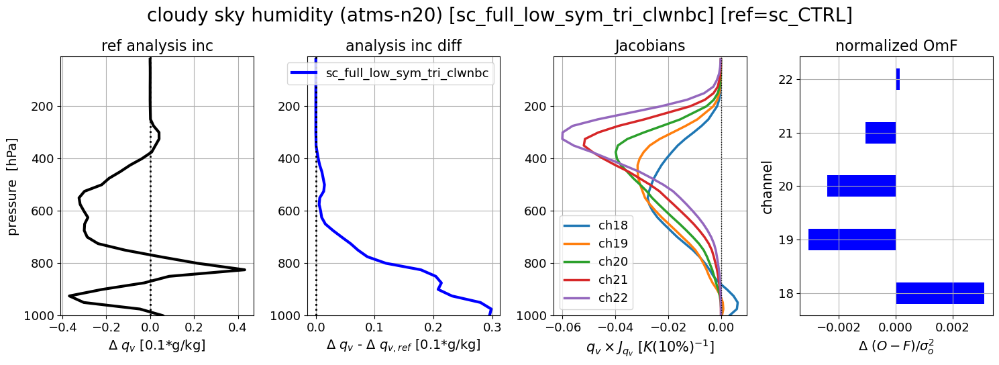

In [70]:
# profile summary cloudy sky - humidity

fig = plt.figure(figsize=(15,5.5))

# define the subplots
ax1 = fig.add_subplot(1, 4, 1)  # Add subplot at position 1
ax2 = fig.add_subplot(1, 4, 2)  # Add subplot at position 2
ax3 = fig.add_subplot(1, 4, 3)  # Add subplot at position 3
ax4 = fig.add_subplot(1, 4, 4)  # Add subplot at position 4

# ax1: reference analysis increment

plt_var = np.mean(np.array(q_inc_cld[expref]), axis=0)
ax1.plot(10*plt_var[5:], pres_interp[5:], linewidth=3, label=rf'$\Delta$ qv ({expref})', color='black', linestyle='-')
ax1.axvline(x=0, color='black', linestyle=':', linewidth=2)
ax1.set_ylim(1000,10)
ax1.set_xlabel(r'$\Delta$ $q_v$ [0.1*g/kg]', fontsize=14)
ax1.set_ylabel('pressure  [hPa]', fontsize=14)
ax1.grid(True)
#ax1.legend(fontsize=13)
ax1.tick_params(axis='both', which='major', labelsize=13)
ax1.set_title('ref analysis inc', fontsize=16)


# ax2: differences in analysis increment
plt_var = np.mean(np.array(qa_cld[exptest]) - np.array(qa_cld[expref]), axis=0)

ax2.plot(10*plt_var[5:], pres_interp[5:], color='blue', linewidth=3, label=rf'{exptest}')
ax2.axvline(x=0, color='black', linestyle=':', linewidth=2)
ax2.set_ylim(1000,10)
#ax2.set_xlim([-0.1,0.1])
#ax.set_xlabel(r'$ \partial T_B / \partial T$  [K/K]', fontsize=14)
#ax2.set_ylabel('pressure  [hPa]', fontsize=14)
ax2.set_xlabel(r"$\Delta$ $q_v$ - $\Delta$ $q_{v,ref}$ [0.1*g/kg]", fontsize=14)
ax2.grid(True)
ax2.tick_params(axis='both', which='major', labelsize=13)
ax2.legend(fontsize=13, loc='upper right')
ax2.set_title('analysis inc diff', fontsize=16)


# ax3: Jacobians
for c, ch in enumerate(plt_chs):
    plt_var = np.mean(np.array(q_jac_cld[expref][ch]),axis=0)
    ax3.plot(plt_var[5:], pres_interp[5:], linewidth=2.5, label=f"ch{ch}")
    
ax3.axvline(x=0, color='black', linestyle=':', linewidth=1)
ax3.set_ylim(1000,10)
#ax.set_xlabel(r'$ \partial T_B / \partial T$  [K/K]', fontsize=14)
#ax3.set_ylabel('pressure  [hPa]', fontsize=14)
ax3.set_xlabel(rf"$ q_v \times J_{{q_v}}$ $[K (10\%)^{{-1}}] $", fontsize=15)
ax3.grid(True)
ax3.tick_params(axis='both', which='major', labelsize=13)
ax3.legend(fontsize=13, loc='best')
ax3.set_title('Jacobians', fontsize=16)


# ax4: channel infos:
bar_height = 0.4

plt_var=[];
for ch in plt_chs:
    plt_var.append(np.mean(np.array(omfnorm_cld[exptest][ch]) - np.array(omfnorm_cld[expref][ch])))
    
ax4.barh([str(ch) for ch in plt_chs], plt_var,  height=bar_height, label=f'{exptest}-{expref}', color='blue')
ax4.set_xlabel(r'$\Delta$ $(O-F)/ \sigma_o^2$', fontsize=14)
ax4.set_yticks([r for r in range(len(plt_chs))], plt_chs, fontsize=14)
#ax4.yaxis.tick_right()
ax4.tick_params(axis='both', which='major', labelsize=13)
#ax4.set_xlim([-0.04,0.04])
ax4.set_ylabel('channel', fontsize=15)
ax4.grid(True)
#ax4.legend(fontsize=13)
ax4.set_title('normalized OmF', fontsize=16)

fig.suptitle(f'cloudy sky humidity ({instr}-{sat}) [{exptest}] [ref={expref}]', fontsize=20)
plt.tight_layout()

if save_fig:
    plt.savefig(f"{fig_dir}/cloudy_humidity_{instr}-{sat}{plt_tag}_{time}_{exptest}_ref_{expref}.png")

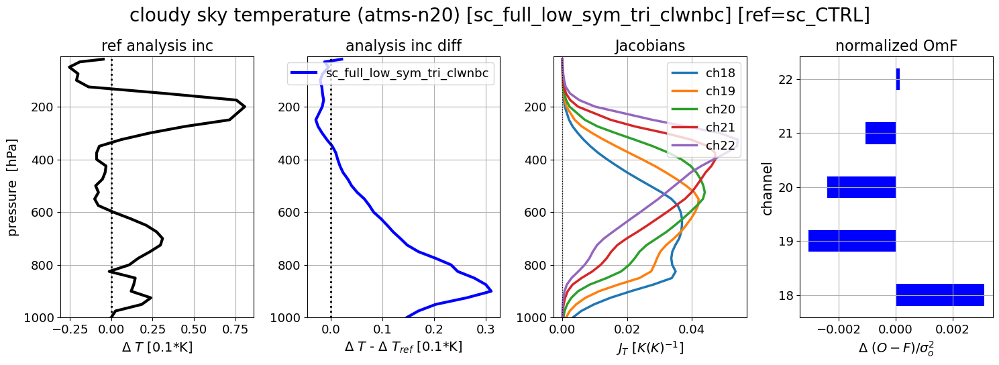

In [71]:
# profile summary cloudy sky - temperature

fig = plt.figure(figsize=(15,5.5))

# define the subplots
ax1 = fig.add_subplot(1, 4, 1)  # Add subplot at position 1
ax2 = fig.add_subplot(1, 4, 2)  # Add subplot at position 2
ax3 = fig.add_subplot(1, 4, 3)  # Add subplot at position 3
ax4 = fig.add_subplot(1, 4, 4)  # Add subplot at position 4

# ax1: reference analysis increment

plt_var = np.mean(np.array(t_inc_cld[expref]), axis=0)
ax1.plot(10*plt_var[5:], pres_interp[5:], linewidth=3, label=rf'$\Delta$ T ({expref})', color='black', linestyle='-')
ax1.axvline(x=0, color='black', linestyle=':', linewidth=2)
ax1.set_ylim(1000,10)
ax1.set_xlabel(r'$\Delta$ $T$ [0.1*K]', fontsize=14)
ax1.set_ylabel('pressure  [hPa]', fontsize=14)
ax1.grid(True)
#ax1.legend(fontsize=13)
ax1.tick_params(axis='both', which='major', labelsize=13)
ax1.set_title('ref analysis inc', fontsize=16)


# ax2: differences in analysis increment
plt_var = np.mean(np.array(ta_cld[exptest]) - np.array(ta_cld[expref]), axis=0)

ax2.plot(10*plt_var[5:], pres_interp[5:], color='blue', linewidth=3, label=rf'{exptest}')
ax2.axvline(x=0, color='black', linestyle=':', linewidth=2)
ax2.set_ylim(1000,10)
#ax2.set_xlim([-0.1,0.1])
#ax.set_xlabel(r'$ \partial T_B / \partial T$  [K/K]', fontsize=14)
#ax2.set_ylabel('pressure  [hPa]', fontsize=14)
ax2.set_xlabel(r"$\Delta$ $T$ - $\Delta$ $T_{ref}$ [0.1*K]", fontsize=14)
ax2.grid(True)
ax2.tick_params(axis='both', which='major', labelsize=13)
ax2.legend(fontsize=13, loc='upper right')
ax2.set_title('analysis inc diff', fontsize=16)


# ax3: Jacobians
for c, ch in enumerate(plt_chs):
    plt_var = np.mean(np.array(t_jac_cld[expref][ch]),axis=0)
    ax3.plot(plt_var[5:], pres_interp[5:], linewidth=2.5, label=f"ch{ch}")
    
ax3.axvline(x=0, color='black', linestyle=':', linewidth=1)
ax3.set_ylim(1000,10)
#ax.set_xlabel(r'$ \partial T_B / \partial T$  [K/K]', fontsize=14)
#ax3.set_ylabel('pressure  [hPa]', fontsize=14)
ax3.set_xlabel(rf"$ J_{{T}}$ $[K (K)^{{-1}}] $", fontsize=14)
ax3.grid(True)
ax3.tick_params(axis='both', which='major', labelsize=13)
ax3.legend(fontsize=13, loc='best')
ax3.set_title('Jacobians', fontsize=16)


# ax4: channel infos:
bar_height = 0.4

plt_var=[];
for ch in plt_chs:
    plt_var.append(np.mean(np.array(omfnorm_cld[exptest][ch]) - np.array(omfnorm_cld[expref][ch])))
    
ax4.barh([str(ch) for ch in plt_chs], plt_var,  height=bar_height, label=f'{exptest}-{expref}', color='blue')
ax4.set_xlabel(r'$\Delta$ $(O-F)/ \sigma_o^2$', fontsize=14)
ax4.set_yticks([r for r in range(len(plt_chs))], plt_chs, fontsize=14)
#ax4.yaxis.tick_right()
ax4.tick_params(axis='both', which='major', labelsize=13)
#ax4.set_xlim([-0.04,0.04])
ax4.set_ylabel('channel', fontsize=15)
ax4.grid(True)
#ax4.legend(fontsize=13)
ax4.set_title('normalized OmF', fontsize=16)

fig.suptitle(f'cloudy sky temperature ({instr}-{sat}) [{exptest}] [ref={expref}]', fontsize=20)
plt.tight_layout()

if save_fig:
    plt.savefig(f"{fig_dir}/cloudy_temperature_{instr}-{sat}{plt_tag}_{time}_{exptest}_ref_{expref}.png")

In [144]:
group_df.get_group(clear_keys[2])['omfnorm_sc_CTRL_ges']

26284   -0.111472
26285   -0.106029
26286   -0.196018
26287   -0.932400
26288   -1.756843
26289   -0.093404
Name: omfnorm_sc_CTRL_ges, dtype: float32